# Dataset characteristics
Attribute Information:
    - MedInc        median income in block group
    - HouseAge      median house age in block group
    - AveRooms      average number of rooms per household
    - AveBedrms     average number of bedrooms per household
    - Population    block group population
    - AveOccup      average number of household members
    - Latitude      block group latitude
    - Longitude     block group l
The target variable is the median house value for California districts,
expressed in hundreds of thousands of dollars ($100,000).

This dataset was derived from the 1990 U.S. census, using one row per cen us
block group. A block group is the smallest geographical unit for which the .S.
Census Bureau publishes sample data (a block group typically has a popul tion
of 600 to 3,000 people).

A household is a group of people residing within a home. Since the average
number of rooms and bedrooms in this dataset are provided per househod, these
columns may take surprisingly large values for block groups with few  ouseholds
and many empty houses, such as vacation resorts.ongitude

## steps followed <a class="anchor" id ="steps"></a>
# steps
[Exploratory data analysis](#step1)<br>
[Feature engineering and correlation matrix](#step2)<br>
[handling outliers and skeweness](#step3)<br>
[check for multicollinearity using VIF](#step4)<br>
[Feature selection using RFECV](#step5)<br>
[Preprocessing & model training](#step6)<br>
[Model evaluation](#step7)<br>
[Ridge regularization](#step8)<br>
[Ensemble methods](#step9)<br>

# Exploratory data analysis<a class="anchor" id="step1"></a>
[go_back_up](#steps)

In [4]:
import pandas as pd
from sklearn.datasets import fetch_california_housing

# Load the data
california_housing = fetch_california_housing()

# Convert to DataFrame
df = pd.DataFrame(california_housing.data, columns=california_housing.feature_names)

# Add target column
df['MedHouseVal'] = california_housing.target

# Preview first rows
df.head()

,MedInc,HouseAge,AveRooms,AveBedrms,Population,AveOccup,Latitude,Longitude,MedHouseVal
0,8.3252,41.0,6.984127,1.023810,322.0,2.555556,37.88,-122.23,4.526
1,8.3014,21.0,6.238137,0.971880,2401.0,2.109842,37.86,-122.22,3.585
2,7.2574,52.0,8.288136,1.073446,496.0,2.802260,37.85,-122.24,3.521
3,5.6431,52.0,5.817352,1.073059,558.0,2.547945,37.85,-122.25,3.413
4,3.8462,52.0,6.281853,1.081081,565.0,2.181467,37.85,-122.25,3.422


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20640 entries, 0 to 20639
Data columns (total 9 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   MedInc       20640 non-null  float64
 1   HouseAge     20640 non-null  float64
 2   AveRooms     20640 non-null  float64
 3   AveBedrms    20640 non-null  float64
 4   Population   20640 non-null  float64
 5   AveOccup     20640 non-null  float64
 6   Latitude     20640 non-null  float64
 7   Longitude    20640 non-null  float64
 8   MedHouseVal  20640 non-null  float64
dtypes: float64(9)
memory usage: 1.4 MB


In [6]:
#features have varying distributions
#we notice outliers in AveRooms,AveBedrms,Population,AveOccup bse of the huge differences btn 75% and max
df.describe()

,MedInc,HouseAge,AveRooms,AveBedrms,Population,AveOccup,Latitude,Longitude,MedHouseVal
count,20640.000000,20640.000000,20640.000000,20640.000000,20640.000000,20640.000000,20640.000000,20640.000000,20640.000000
mean,3.870671,28.639486,5.429000,1.096675,1425.476744,3.070655,35.631861,-119.569704,2.068558
std,1.899822,12.585558,2.474173,0.473911,1132.462122,10.386050,2.135952,2.003532,1.153956
min,0.499900,1.000000,0.846154,0.333333,3.000000,0.692308,32.540000,-124.350000,0.149990
25%,2.563400,18.000000,4.440716,1.006079,787.000000,2.429741,33.930000,-121.800000,1.196000
50%,3.534800,29.000000,5.229129,1.048780,1166.000000,2.818116,34.260000,-118.490000,1.797000
75%,4.743250,37.000000,6.052381,1.099526,1725.000000,3.282261,37.710000,-118.010000,2.647250
max,15.000100,52.000000,141.909091,34.066667,35682.000000,1243.333333,41.950000,-114.310000,5.000010


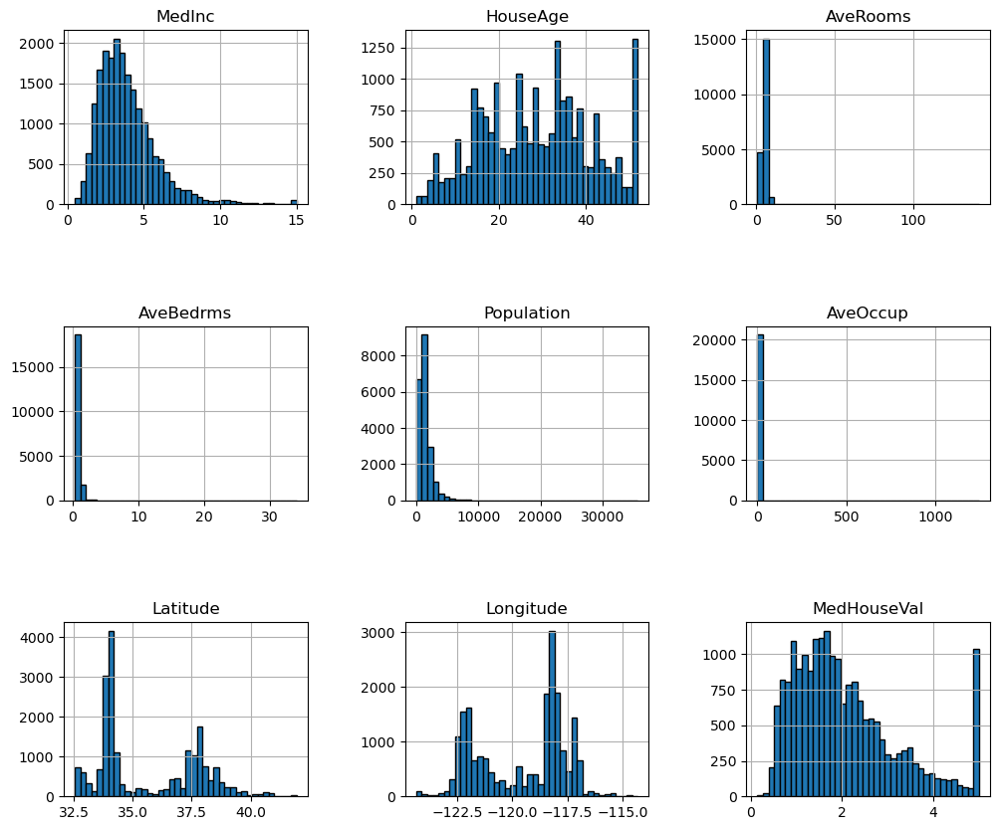

In [7]:
import matplotlib.pyplot as plt
df.hist(figsize=(12, 10), bins=40, edgecolor="black")
plt.subplots_adjust(hspace=0.7, wspace=0.4)

C:\Users\HP\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\HP\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\HP\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\HP\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  

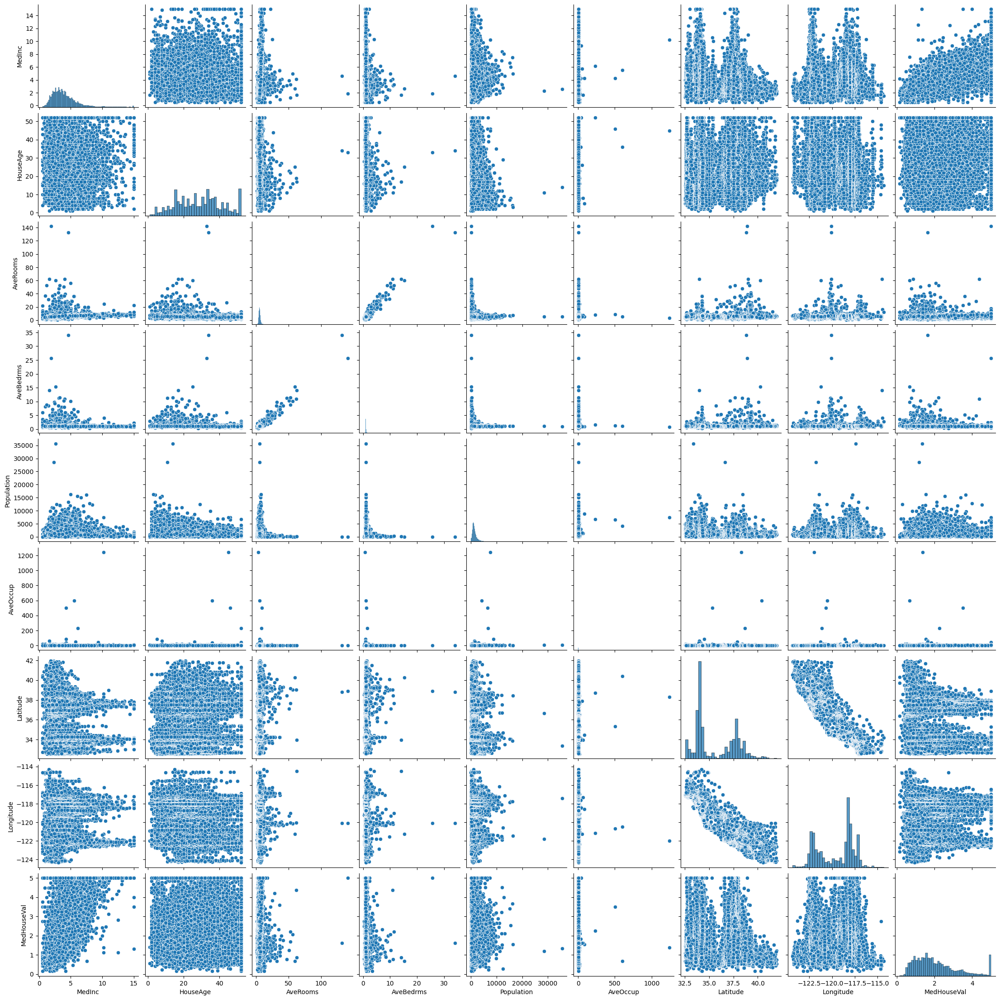

In [8]:
# observing outliers using boxplots
import matplotlib.pyplot as plt
import seaborn as sns
sns.pairplot(df, kind='scatter', diag_kind='hist')

In [9]:
import plotly.express as px
##custom function for creating a mapbox for different parameters in the california housing dataset
def housing_map(data, title="Median house value by location", size="Population", color="MedHouseVal", color_scale=px.colors.cyclical.IceFire):
    
    # Set the Mapbox access token
    px.set_mapbox_access_token('pk.eyJ1IjoibWlpbTg1IiwiYSI6ImNtMjd2Z2M0YjFnamgyaXNnaHUxZXVuZXcifQ.H_vKScQXDOtcjReY35XyeQ')
    
    # Create the scatter mapbox figure
    fig_price = px.scatter_mapbox(
        data, 
        lat="Latitude", 
        lon="Longitude", 
        color=color, 
        size=size, 
        color_continuous_scale=color_scale, 
        size_max=10, 
        zoom=10, 
        height=700,
        title=title
    )
    
    # Show the figure
    fig_price.show()


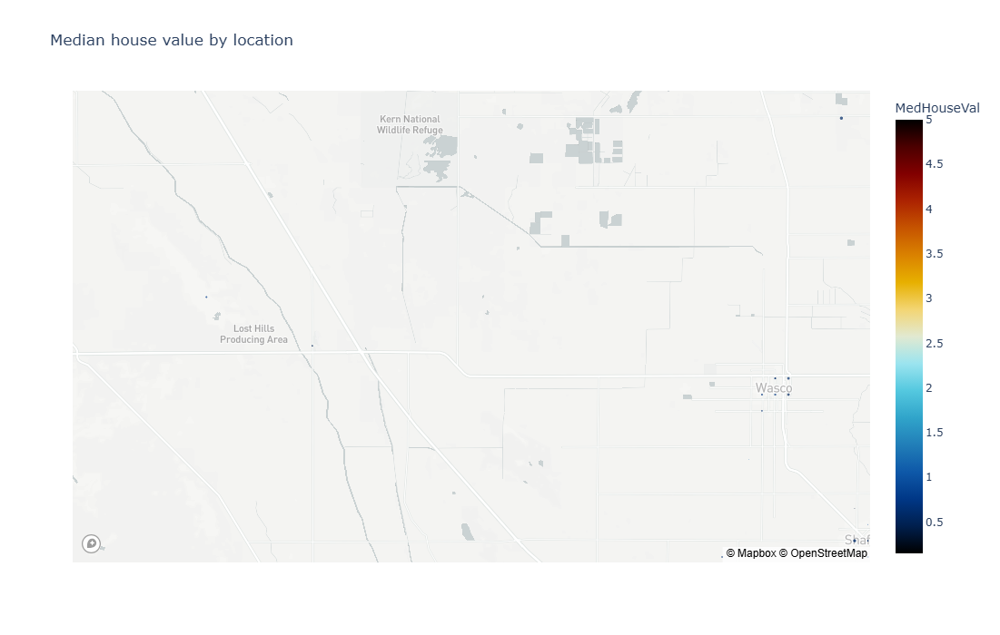

In [10]:
#We note that the high-valued houses will be located on the coast, 
#where the big cities from California are located: San Diego, Los Angeles, San Jose, or San Francisco.
housing_map(df)

In [11]:
#we can do subsampling so that we have fewer data points
import numpy as np

rng = np.random.RandomState(0)
indices = rng.choice(
    np.arange(df.shape[0]), size=500, replace=False)

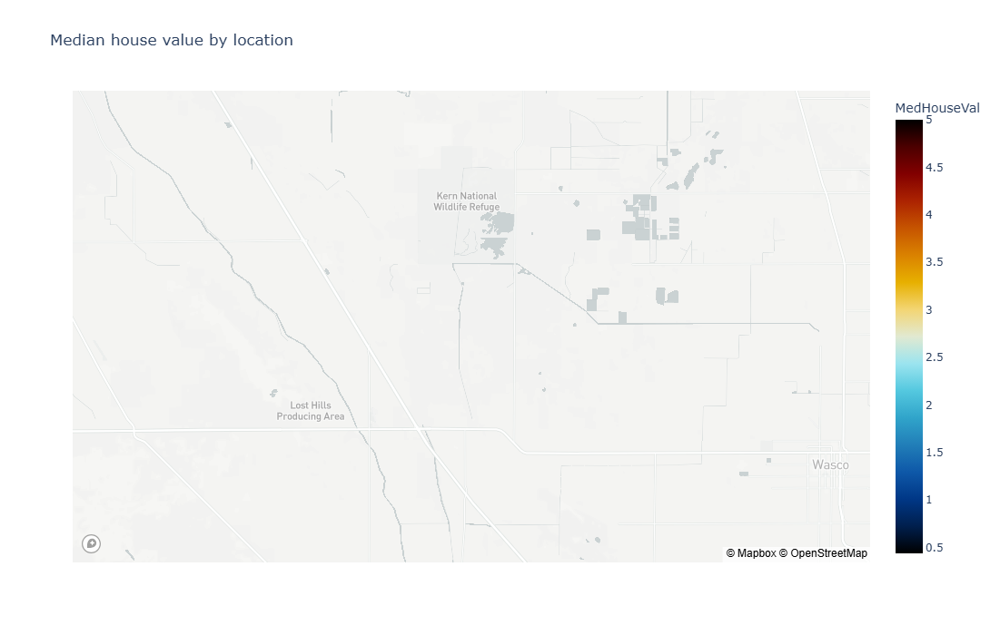

In [12]:
data = df.iloc[indices]
housing_map(data)

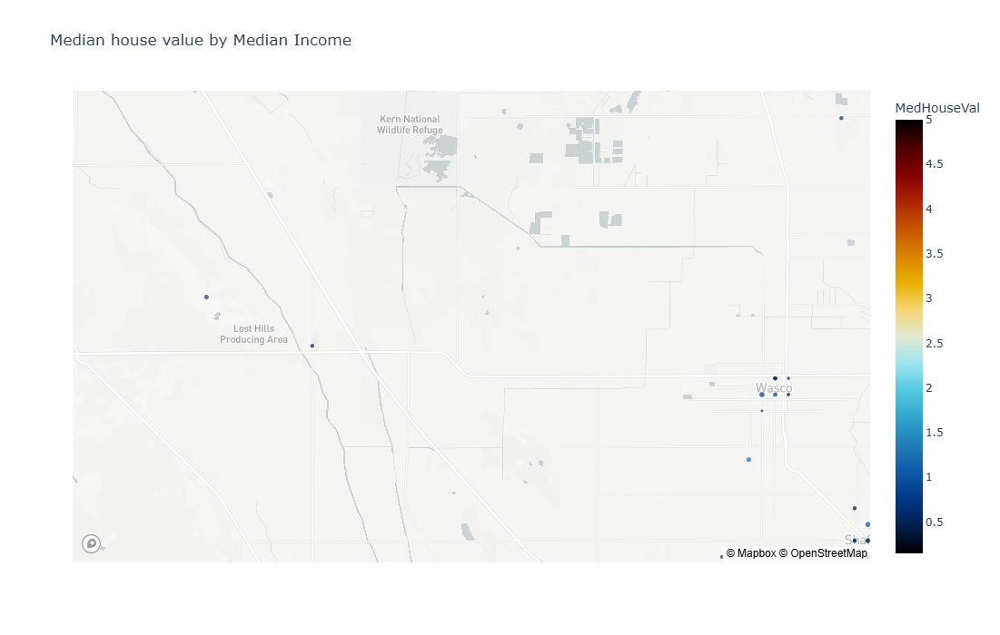

In [13]:

housing_map(df, title="Median house value by Median Income", size="MedInc", color="MedHouseVal", color_scale=px.colors.cyclical.IceFire)

## Feature engineering and correlation matrix<a class="anchor" id="step2"></a>
[go_back_up](#steps)

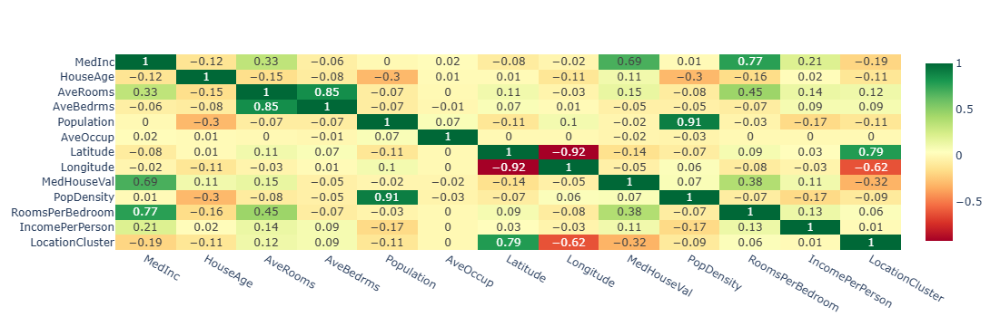

In [15]:
import numpy as np
from sklearn.cluster import KMeans
# Feature Engineering
# 1. Population Density
df['PopDensity'] = df['Population'] / df['AveOccup']

# 2. Rooms per Bedroom
df['RoomsPerBedroom'] = df['AveRooms'] / df['AveBedrms']

# 3. Income per Person
df['IncomePerPerson'] = df['MedInc'] / df['Population']

# 4. Clustering Latitude and Longitude
kmeans = KMeans(n_clusters=5, random_state=42)
df['LocationCluster'] = kmeans.fit_predict(df[['Latitude', 'Longitude']])

# Step 7: Correlation Heatmap
fig =px.imshow(df.corr().round(2), text_auto =True,aspect ='auto',color_continuous_scale ='rdylgn')
fig.show()

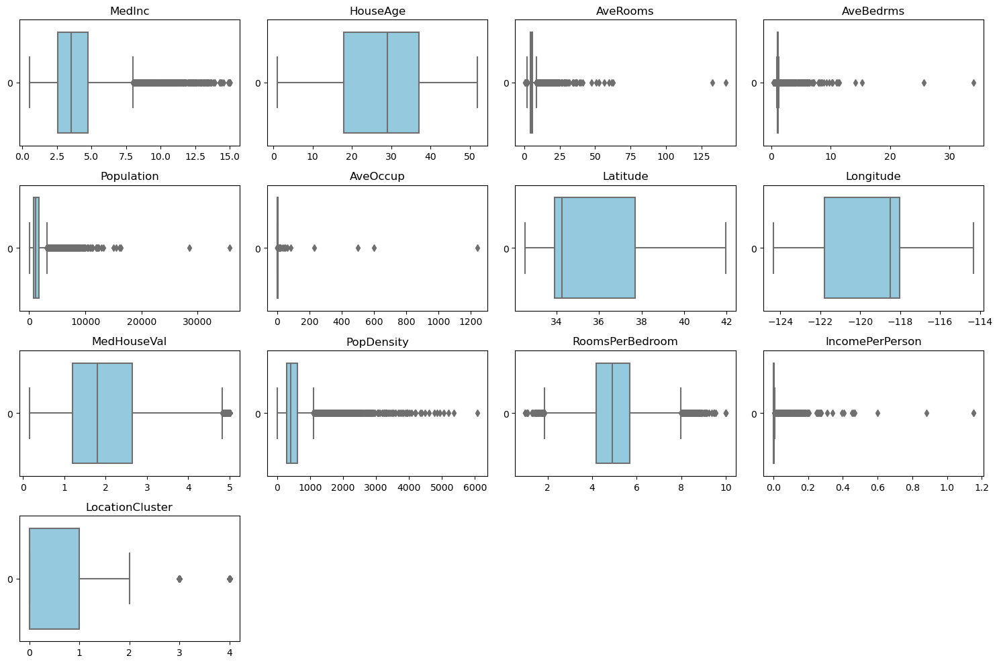

MedInc              1.646657
HouseAge            0.060331
AveRooms           20.697869
AveBedrms          31.316956
Population          4.935858
AveOccup           97.639561
Latitude            0.465953
Longitude          -0.297801
MedHouseVal         0.977763
PopDensity          3.410438
RoomsPerBedroom     0.339085
IncomePerPerson    33.260961
LocationCluster     1.318385
dtype: float64

In [16]:
# observing outliers using boxplots
import matplotlib.pyplot as plt
import seaborn as sns

# Plotting boxplots for outlier detection
plt.figure(figsize=(15, 10))
for i, column in enumerate(df.columns, 1):
    plt.subplot(4, 4, i)
    sns.boxplot(df[column], orient="h", color="skyblue")
    plt.title(column)
plt.tight_layout()
plt.show()

# Skewness of each feature
skewness = df.skew()
skewness


In [17]:
### from the summary statistics table we see outliers
### from the box plot we see right skewness
### from the correlation matrix(low values close to zero)&pairplot we see non linearity

## handling outliers and skeweness <a class="anchor" id="step3"></a>
[go_back_up](#steps)
-Highly skewed variables (e.g., AveRooms, AveBedrms, Population, AveOccup):
-may need transformations like log, square root, or Box-Cox transformations to reduce skewness
-if these variables are used in a model that assumes normality (e.g., linear regression).
-Nearly symmetric variables (e.g., HouseAge, Latitude, Longitude):Likely don't require transformations.
-Moderately skewed variables (e.g., MedInc, MedHouseVal):
-May benefit from transformations depending on the analysis or model requirements.

In [19]:
import numpy as np

# Function to cap outliers
def cap_outliers(series, lower_percentile=0.01, upper_percentile=0.99):
    lower_limit = series.quantile(lower_percentile)
    upper_limit = series.quantile(upper_percentile)
    return series.clip(lower=lower_limit, upper=upper_limit)

# Logarithmic transformation for high skewed features before capping(high values from skeweness)
# we apply log transformation before capping for variables with high skewness
right_skewed_features = ['AveBedrms','AveOccup','AveRooms','IncomePerPerson']
for feature in right_skewed_features:
    df[feature] = np.log1p(df[feature])  # log1p avoids issues with log(0)
    
# Handle outliers: Apply capping to specific features
outlier_features = ['MedInc', 'AveRooms', 'AveBedrms','Population','AveOccup','PopDensity',]
for feature in outlier_features:
    data[feature] = cap_outliers(df[feature])

# Logarithmic transformation for right-skewed features
right_skewed_features = ['MedInc','Population','MedHouseVal','LocationCluster','PopDensity','IncomePerPerson']
for feature in right_skewed_features:
    df[feature] = np.log1p(df[feature])  # log1p avoids issues with log(0)

# Square transformation for left-skewed feature
df['Longitude'] = df['Longitude'] ** 2

# Rechecking skewness after transformations
capped_skewness = df.skew()
print("Skewness after outlier capping:")
print(capped_skewness)

# Transformed skewness
transformed_skewness = df.skew()
print("\nSkewness after transformations:")
print(transformed_skewness)


Skewness after outlier capping:
MedInc              0.226083
HouseAge            0.060331
AveRooms            1.390761
AveBedrms           8.988786
Population         -1.044087
AveOccup            3.879679
Latitude            0.465953
Longitude           0.312330
MedHouseVal         0.275939
PopDensity         -1.051607
RoomsPerBedroom     0.339085
IncomePerPerson    19.446682
LocationCluster     0.747408
dtype: float64

Skewness after transformations:
MedInc              0.226083
HouseAge            0.060331
AveRooms            1.390761
AveBedrms           8.988786
Population         -1.044087
AveOccup            3.879679
Latitude            0.465953
Longitude           0.312330
MedHouseVal         0.275939
PopDensity         -1.051607
RoomsPerBedroom     0.339085
IncomePerPerson    19.446682
LocationCluster     0.747408
dtype: float64


C:\Users\HP\AppData\Local\Temp\ipykernel_10292\4036217103.py:18: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\HP\AppData\Local\Temp\ipykernel_10292\4036217103.py:18: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\HP\AppData\Local\Temp\ipykernel_10292\4036217103.py:18: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs

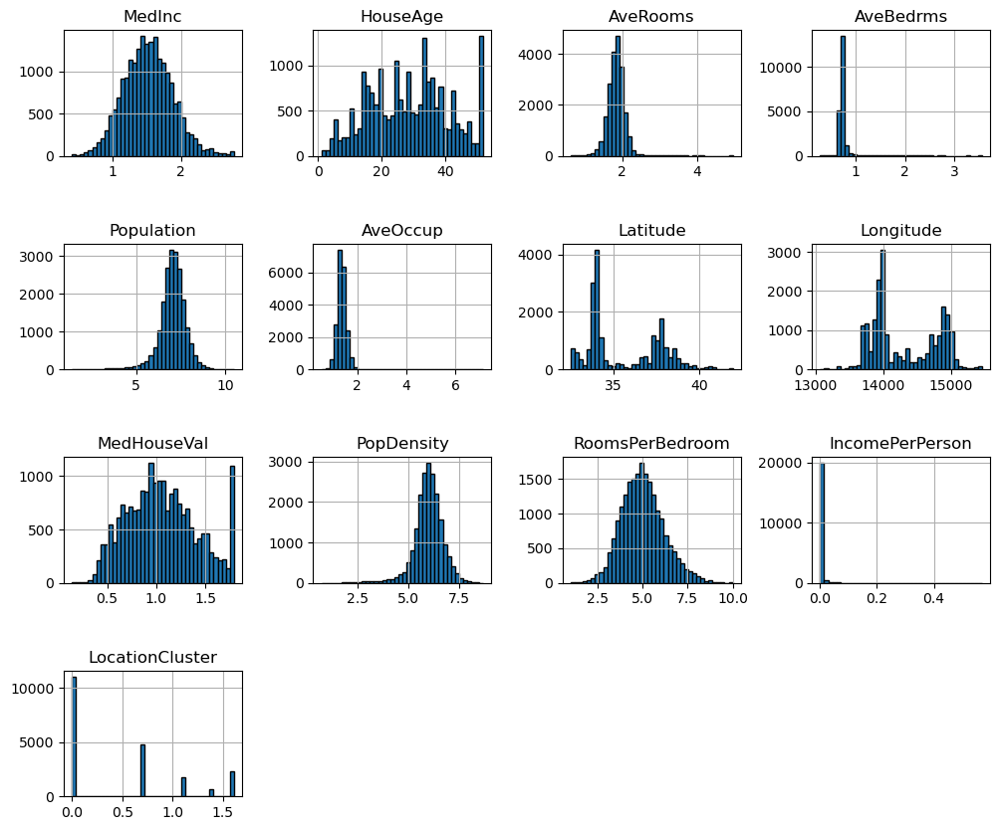

In [20]:
#visualization after feature transformation
import matplotlib.pyplot as plt
df.hist(figsize=(12, 10), bins=40, edgecolor="black")
plt.subplots_adjust(hspace=0.7, wspace=0.4)

## check multicollinearity<a class="anchor" id="step4"></a>
[go_back_up](#steps)

In [22]:
# selecting targets and predictors
#with median house val as our target. we have a regression task
target = df[['MedHouseVal']]
predictors = df.drop(columns= 'MedHouseVal', axis =1)

In [23]:
#check multicollinearity
#AveBedrms,AveRooms,Longitude,Latitude have a high VIF indicating that they are highly correlated with other features
#this is confirmed in the correlation matrix
#we may consider combining them or keeping one
import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor

# Don't show numbers in scientific notation
pd.set_option("display.float_format", "{:.2f}".format)

#Adding a constant for the intercept term
predictors = sm.add_constant(predictors)

# Calculating VIF for each variable
vif_data = pd.DataFrame()
vif_data["feature"] = predictors.columns
vif_data["VIF"] = [variance_inflation_factor(predictors.values, i) for i in range(predictors.shape[1])]

print(vif_data.sort_values(by = 'VIF'))

            feature     VIF
2          HouseAge    1.29
11  IncomePerPerson    1.62
1            MedInc    3.55
12  LocationCluster    4.66
8         Longitude    9.85
7          Latitude   15.12
4         AveBedrms   19.21
10  RoomsPerBedroom   38.04
3          AveRooms   46.41
6          AveOccup  106.22
9        PopDensity  785.36
5        Population  799.43
0             const 3560.79


# Feature selection<a class="anchor" id="step5"></a>
[go_back_up](#steps)

In [25]:
from sklearn.feature_selection import RFECV 
from sklearn.linear_model import LinearRegression

y = df[['MedHouseVal']]
X = df.drop(columns= 'MedHouseVal',axis =1)

regressor = LinearRegression()
feature_selector = RFECV(regressor)

fit = feature_selector.fit(X,y)

optimal_feature_count = feature_selector.n_features_
print(f"Optimal numer of features: {optimal_feature_count}")

Optimal numer of features: 12


# preprocessing data and model training<a class="anchor" id="step6"></a>
[go_back_up](#steps)

In [28]:
#selecting features
#longitude is removed because of high vif
y = df[['MedHouseVal']]
X = df.drop(columns= 'MedHouseVal',axis =1)

In [29]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
X_std = pd.DataFrame(scaler.fit_transform(X),columns =X.columns)
#X_std.describe()

In [30]:
#traintest split
from sklearn.model_selection import train_test_split 
X_train, X_test, y_train, y_test = train_test_split(X_std, y, test_size=0.2, random_state=0)
X_train.shape

(16512, 12)

In [31]:
#train the linear regression model
from sklearn.linear_model import LinearRegression
model = LinearRegression()
model.fit(X_train, y_train)
coeff_df = pd.DataFrame(model.coef_, columns= X.columns) 
coeff_df

,MedInc,HouseAge,AveRooms,AveBedrms,Population,AveOccup,Latitude,Longitude,PopDensity,RoomsPerBedroom,IncomePerPerson,LocationCluster
0,0.22,0.03,-0.24,0.17,-1.21,0.37,-0.25,0.28,1.20,0.20,-0.02,-0.07


# Model evaluation<a class="anchor" id="step7"></a>
[go_back_up](#steps)

In [33]:
import statsmodels.api as sm
X_train2 = sm.add_constant(X_train)
est = sm.OLS(y_train, X_train2)
est2 = est.fit()
print(est2.summary())

                            OLS Regression Results                            
Dep. Variable:            MedHouseVal   R-squared:                       0.707
Model:                            OLS   Adj. R-squared:                  0.707
Method:                 Least Squares   F-statistic:                     3317.
Date:                Tue, 24 Dec 2024   Prob (F-statistic):               0.00
Time:                        17:36:14   Log-Likelihood:                 3721.3
No. Observations:               16512   AIC:                            -7417.
Df Residuals:                   16499   BIC:                            -7316.
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
                      coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------
const               1.0568      0.002    7

In [34]:
y_train_pred = model.predict(X_train)
y_test_pred = model.predict(X_test)

In [35]:
from sklearn import metrics
import numpy as np
print('Mean Absolute Error on Test Data:', round(metrics.mean_absolute_error(y_test, y_test_pred),3))
print('Mean Absolute Error on Training Data:', round(metrics.mean_absolute_error(y_train, y_train_pred),3))

print('Mean Squared Error on Test Data:', round(metrics.mean_squared_error(y_test, y_test_pred),3))   
print('Mean Squared Error on Training Data:', round(metrics.mean_squared_error(y_train, y_train_pred),3))

print('Root Mean Squared Error on Test Data:', round(np.sqrt(metrics.mean_squared_error(y_test, y_test_pred)),3)) 
print('Root Mean Squared Error on Training Data:', round(np.sqrt(metrics.mean_squared_error(y_train, y_train_pred)),3)) 

Mean Absolute Error on Test Data: 0.148
Mean Absolute Error on Training Data: 0.146
Mean Squared Error on Test Data: 0.039
Mean Squared Error on Training Data: 0.037
Root Mean Squared Error on Test Data: 0.197
Root Mean Squared Error on Training Data: 0.193


what happens when we remove some redundant features

# Ridge regularization<a class="anchor" id="step8"></a>
[go_back_up](#steps)

In [38]:
from sklearn.linear_model import RidgeCV
from sklearn.model_selection import cross_validate
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import make_pipeline

alphas = np.logspace(-3, 1, num=30)
ridge = make_pipeline(StandardScaler(), RidgeCV(alphas= alphas))
cv_results = cross_validate(ridge,X,y,return_estimator=True,n_jobs=2)


In [39]:
score = cv_results["test_score"]
print(f"R2 score: {score.mean():.3f} ± {score.std():.3f}")

R2 score: 0.640 ± 0.051


In [40]:
ridge.fit(X_train, y_train)
y_train_pred2 = ridge.predict(X_train)
y_test_pred2 = ridge.predict(X_test)

In [41]:
from sklearn import metrics
import numpy as np
print('Mean Absolute Error on Test Data:', round(metrics.mean_absolute_error(y_test, y_test_pred2),3))
print('Mean Absolute Error on Training Data:', round(metrics.mean_absolute_error(y_train, y_train_pred2),3))

print('Mean Squared Error on Test Data:', round(metrics.mean_squared_error(y_test, y_test_pred2),3))   
print('Mean Squared Error on Training Data:', round(metrics.mean_squared_error(y_train, y_train_pred2),3))

print('Root Mean Squared Error on Test Data:', round(np.sqrt(metrics.mean_squared_error(y_test, y_test_pred2)),3)) 
print('Root Mean Squared Error on Training Data:', round(np.sqrt(metrics.mean_squared_error(y_train, y_train_pred2)),3)) 

Mean Absolute Error on Test Data: 0.148
Mean Absolute Error on Training Data: 0.146
Mean Squared Error on Test Data: 0.039
Mean Squared Error on Training Data: 0.037
Root Mean Squared Error on Test Data: 0.197
Root Mean Squared Error on Training Data: 0.193


# Employing ensemble methods<a class="anchor" id="step9"></a>
[go_back_up](#steps)

In [43]:
from sklearn.linear_model import Ridge
from sklearn.ensemble import BaggingRegressor
from sklearn.model_selection import cross_validate
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import make_pipeline
import numpy as np

# Create Ridge model
ridge = Ridge(alpha=1.0)

# Create Bagging model with Ridge as base estimator
bagging_ridge = BaggingRegressor(estimator=ridge, n_estimators=50, random_state=42)

# Create pipeline with scaling and BaggingRegressor
pipeline = make_pipeline(StandardScaler(), bagging_ridge)

# Evaluate the model using cross-validation
cv_results = cross_validate(pipeline, X, y, return_estimator=True, n_jobs=2)

print(f"R2 score: {cv_results['test_score'].mean():.3f} ± {cv_results['test_score'].std():.3f}")


R2 score: 0.640 ± 0.052


In [44]:
from sklearn.ensemble import RandomForestRegressor
forest = RandomForestRegressor( n_estimators = 100, random_state= 0)
# Create pipeline with scaling and forestRegressor
pipeline = make_pipeline(StandardScaler(), forest)

# Evaluate the model using cross-validation
cv_results = cross_validate(pipeline, X, y, return_estimator=True, n_jobs=2)

print(f"R2 score: {cv_results['test_score'].mean():.3f} ± {cv_results['test_score'].std():.3f}")


R2 score: 0.616 ± 0.106


In [45]:
forest.fit(X_train, np.ravel(y_train))
y_forest_pred_test = forest.predict(X_test)
y_forest_pred_train = forest.predict(X_train)

In [46]:
from sklearn import metrics
import numpy as np
print('Mean Absolute Error on Test Data:', round(metrics.mean_absolute_error(y_test, y_forest_pred_test),3))
print('Mean Absolute Error on Training Data:', round(metrics.mean_absolute_error(y_train,y_forest_pred_train ),3))

print('Mean Squared Error on Test Data:', round(metrics.mean_squared_error(y_test, y_forest_pred_test),3))   
print('Mean Squared Error on Training Data:', round(metrics.mean_squared_error(y_train, y_forest_pred_train),3))

print('Root Mean Squared Error on Test Data:', round(np.sqrt(metrics.mean_squared_error(y_test, y_forest_pred_test)),3)) 
print('Root Mean Squared Error on Training Data:', round(np.sqrt(metrics.mean_squared_error(y_train, y_forest_pred_train)),3)) 

Mean Absolute Error on Test Data: 0.148
Mean Absolute Error on Training Data: 0.146
Mean Squared Error on Test Data: 0.039
Mean Squared Error on Training Data: 0.037
Root Mean Squared Error on Test Data: 0.197
Root Mean Squared Error on Training Data: 0.193


In [47]:
importances = forest.feature_importances_
df = pd.DataFrame({'feature': X_train.columns,'importance': importances})
df = df.sort_values('importance')
print(df)

            feature  importance
4        Population        0.01
8        PopDensity        0.01
10  IncomePerPerson        0.01
3         AveBedrms        0.02
2          AveRooms        0.02
9   RoomsPerBedroom        0.02
1          HouseAge        0.03
6          Latitude        0.08
7         Longitude        0.11
5          AveOccup        0.11
11  LocationCluster        0.11
0            MedInc        0.47


In [67]:
from sklearn.tree import DecisionTreeRegressor
tree = DecisionTreeRegressor(random_state=0)
# Create pipeline with scaling and treeRegressor
pipeline = make_pipeline(StandardScaler(), tree)

# Evaluate the model using cross-validation
cv_results = cross_validate(pipeline, X, y, return_estimator=True, n_jobs=2)

print(f"R2 score: {cv_results['test_score'].mean():.3f} ± {cv_results['test_score'].std():.3f}")

R2 score: 0.327 ± 0.162


In [73]:
import numpy as np
from sklearn.model_selection import GridSearchCV
params ={ 'max_leaf_nodes': list(range(2,50)), 'max_depth':np.arange(3,15)}
tree_grid = GridSearchCV(tree,params,cv=10)
tree_grid.fit(X_train, y_train)

C:\Users\HP\anaconda3\Lib\site-packages\numpy\ma\core.py:2820: RuntimeWarning:

invalid value encountered in cast



GridSearchCV(cv=10, estimator=DecisionTreeRegressor(random_state=0),
             param_grid={'max_depth': array([ 3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14]),
                         'max_leaf_nodes': [2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12,
                                            13, 14, 15, 16, 17, 18, 19, 20, 21,
                                            22, 23, 24, 25, 26, 27, 28, 29, 30,
                                            31, ...]})

In [75]:
tree_grid.best_estimator_

DecisionTreeRegressor(max_depth=10, max_leaf_nodes=49, random_state=0)

In [77]:
from sklearn.tree import DecisionTreeRegressor
tree = DecisionTreeRegressor(max_depth=10, max_leaf_nodes=49, random_state=0)
# Create pipeline with scaling and treeRegressor
pipeline = make_pipeline(StandardScaler(), tree)

# Evaluate the model using cross-validation
cv_results = cross_validate(pipeline, X, y, return_estimator=True, n_jobs=2)

print(f"R2 score: {cv_results['test_score'].mean():.3f} ± {cv_results['test_score'].std():.3f}")

R2 score: 0.461 ± 0.092
